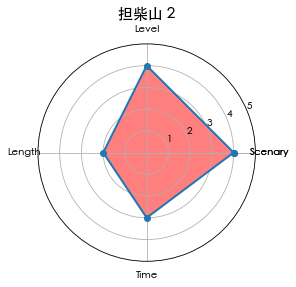

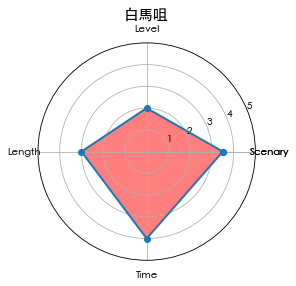

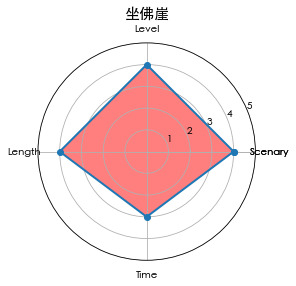

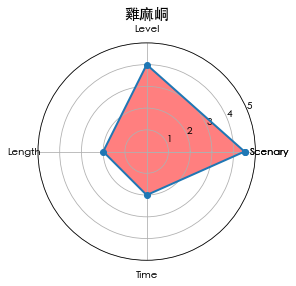

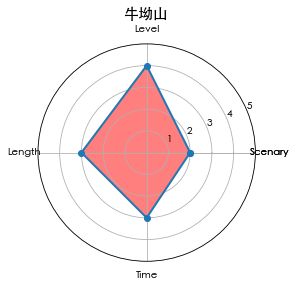

...

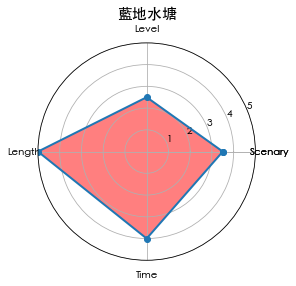

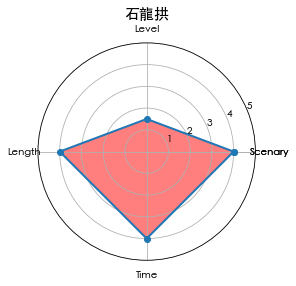

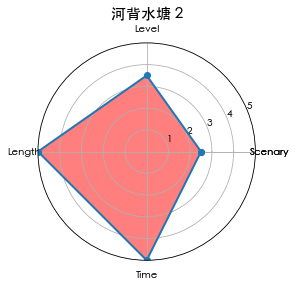

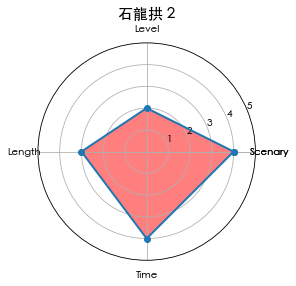

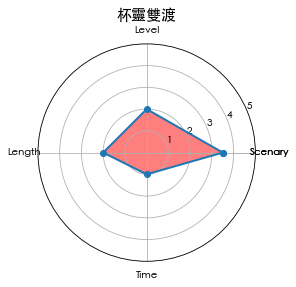

In [3]:
import requests
from bs4 import BeautifulSoup
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

headers = {
    'User-Agent':
    'Mozilla/5.0 (Macintosh; Intel Mac OS X 10_15_7) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/90.0.4430.212 Safari/537.36'
}
res = requests.get("https://www.oasistrek.com/trail_summary.php",
                   headers=headers)
soup = BeautifulSoup(res.text, 'html.parser')

items = soup.find_all('tr')

names = []
for i in items:
    i = i.find_all('td')
    for j in i:
        name = j.find('a')
        if name != None:
            name = name.text
            names.append(name)

Length = []
Time = []
for i in items:
    length = i.find_all('td', class_='s-right')
    for j in length:
        j = j.text
        if j.find('km') == -1:
            Time.append(j)
        else:
            Length.append(j)

Length = [x.strip(' km') for x in Length]
Length = [float(x) for x in Length]
Time = [x.strip(' hrs') for x in Time]
Time = [float(x) for x in Time]

Scenary = []
items2 = soup.find_all('td')
Level = []
for item in items2:
    i = item.find('img', src="images/common_image/star2_icon.gif")
    j = item.find('img', src="images/common_image/star_icon.gif")
    if i != None:
        scenary = i['alt']
        Scenary.append(scenary)
    if j != None:
        level = j['alt']
        Level.append(level)

Scenary = [float(x) for x in Scenary]
Level = [float(x) for x in Level]

l = np.array([Length, Time])
dataset = pd.DataFrame(l)
dataset = dataset.T
dataset.describe()


def len_score(x):
    if x <= 5:
        return 5
    elif x <= 7:
        return 4
    elif x <= 10:
        return 3
    elif x <= 14:
        return 2
    else:
        return 1


def time_score(x):
    if x <= 2:
        return 5
    elif x <= 3:
        return 4
    elif x <= 4:
        return 3
    elif x <= 5:
        return 2
    else:
        return 1


dataset['len_score'] = dataset[0].apply(len_score)
dataset['time_score'] = dataset[1].apply(time_score)
Len_score = dataset['len_score'].values
Time_score = dataset['time_score'].values

rate = zip(Scenary, Level, Len_score, Time_score)
ratelist = []
for i in rate:
    i_list = []
    for j in i:
        i_list.append(j)
    ratelist.append(i_list)

for i in range(358):
    plt.rcParams['font.family'] = 'Heiti TC'

    feature = np.array(["Scenary", "Level", "Length", "Time"])
    values = ratelist[i]
    N = len(values)

    angles = np.linspace(0, 2 * np.pi, N, endpoint=False)

    values = np.concatenate((values, [values[0]]))
    angles = np.concatenate((angles, [angles[0]]))
    feature = np.concatenate((feature, [feature[0]]))

    fig = plt.figure()
    ax = fig.add_subplot(111, polar=True)
    ax.plot(angles, values, 'o-', linewidth=2)
    ax.fill(angles, values, 'r', alpha=0.5)
    ax.set_thetagrids(angles * 180 / np.pi, feature)
    ax.set_ylim(0, 5)
    mount_name = names[i]
    plt.title(mount_name, fontsize=15)
    ax.grid(True)
    plt.show()